In [45]:
import cogsworth
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import astropy.units as u
import gala.potential as gp
from gala.units import galactic

import agama
agama.setUnits(**{k: galactic[k] for k in ['length', 'mass', 'velocity']})

In [2]:
# this all just makes plots look nice
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)
pd.options.display.max_columns = 999

The distribution function for Sanders & Binney (2015) can be written as
$$ f(\mathbf{J}) = \frac{1}{8 \pi^3} [1 + \tanh(J_\phi / L_0)] \cdot \frac{\Omega}{R_d^2 \kappa^2} e^{-R_c / R_d} \cdot \frac{\kappa}{\sigma_r^2} e^{-\kappa J_r / \sigma_r^2} \cdot \frac{\nu}{\sigma_z^2} e^{-\nu J_r / \sigma_z^2} $$

In [3]:
carina = cogsworth.sfh.CarinaDwarf(size=100000, fixed_Z=0.001, tau_min=6.9 * u.Gyr, galaxy_age=7 * u.Gyr)

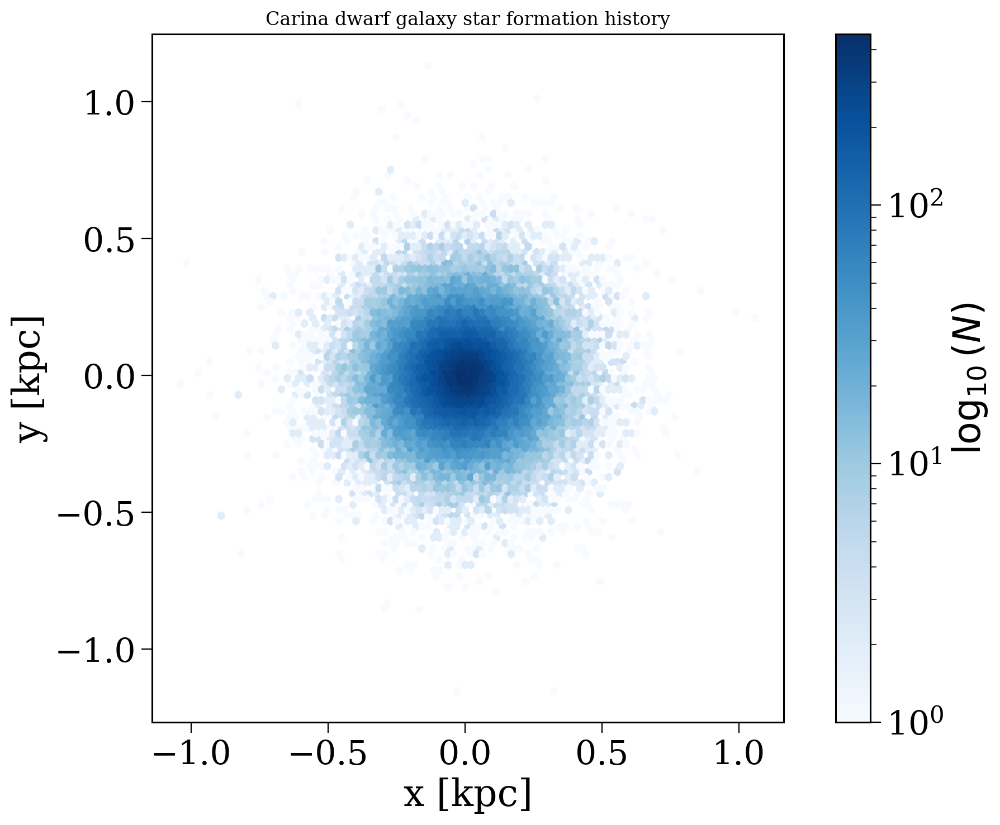

In [9]:
fig, ax = plt.subplots()

hex = ax.hexbin(carina.x, carina.y, gridsize=100, cmap='Blues', mincnt=1, bins='log')
cb = fig.colorbar(hex, ax=ax, label=r'$\log_{10}(N)$')
ax.set_xlabel('x [kpc]')
ax.set_ylabel('y [kpc]')
ax.set_title('Carina dwarf galaxy star formation history')
ax.set_aspect('equal')
plt.show()

In [30]:
sb15 = cogsworth.sfh.SandersBinney2015(100000, potential=gp.MilkyWayPotential2022(), verbose=True)

Setting up Sanders & Binney 2015 star formation history model to work with Agama
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 80960 stars from the thin_disc
    Sampling 9767 stars with lookback times between 0.00 Gyr and 2.00 Gyr
    Sampling 12129 stars with lookback times between 2.00 Gyr and 4.00 Gyr
    Sampling 15930 stars with lookback times between 4.00 Gyr and 6.00 Gyr
    Sampling 19550 stars with lookback times between 6.00 Gyr and 8.00 Gyr
    Sampling 23584 stars with lookback times between 8.00 Gyr and 10.00 Gyr
  Sampling 19040 stars from the thick_disc
    Sampling 19040 stars with lookback times between 10.00 Gyr and 12.00 Gyr


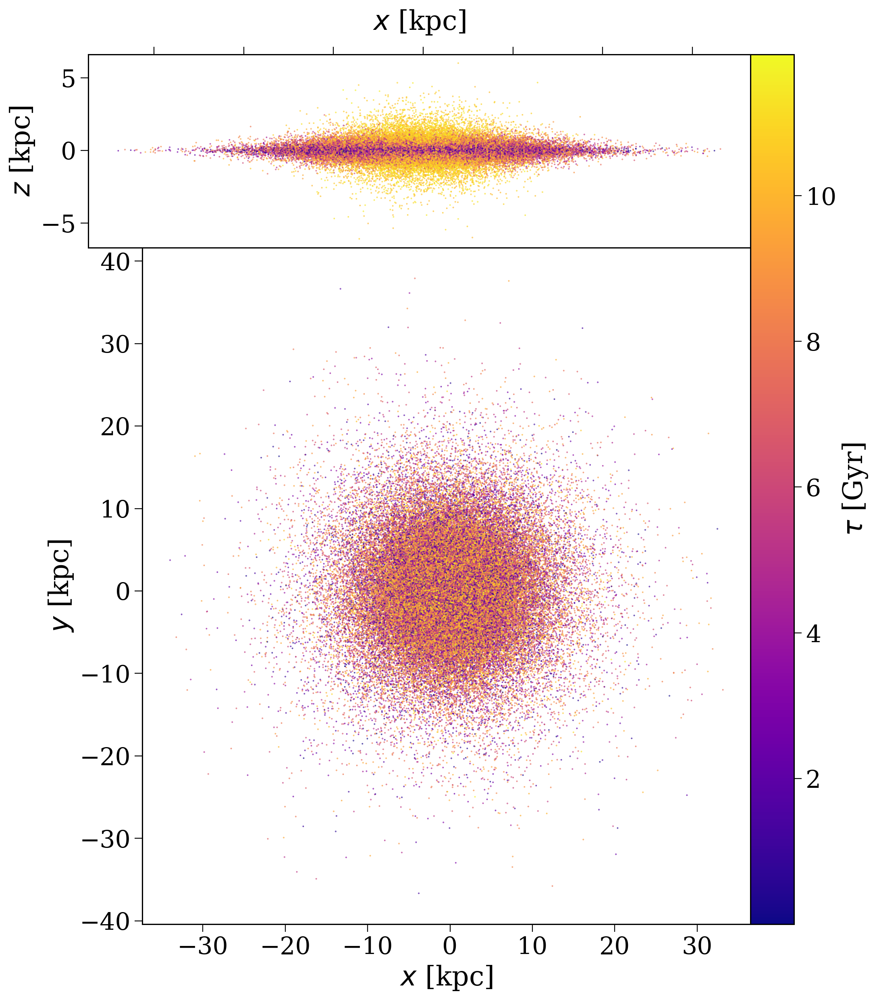

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [31]:
sb15.plot(colour_by=sb15.tau.value, cbar_norm=None, cbar_label=r'$\tau$ [Gyr]')

In [ ]:
class MWAnnulus(cogsworth.sfh.SandersBinney2015):
    def _generate_df(self, J, component, tau):
        """Generate a distribution function for a given component and lookback time

        Follows `Sanders & Binney 2015 <https://ui.adsabs.harvard.edu/abs/2015MNRAS.449.3479S/abstract>`_
        Eq. 3.1.
        
        Parameters
        ----------
        J : `array-like`, shape (N, 3)
            Actions in (J_r, J_phi, J_z) in units of kpc^2 / Myr
        component : `str`
            Either "thin_disc" or "thick_disc"
        tau : :class:`~astropy.units.Quantity` [time]
            Lookback time

        Returns
        -------
        df_val : `array-like`, shape (N,)
            Value of the distribution function at the given actions
        """
        assert component in ["thin_disc", "thick_disc"], "Component must be 'thin_disc' or 'thick_disc'"

        J_r, J_z, J_phi = J.T

        # only compute the DF where the prior interpolations are valid
        df_val = np.full_like(J_r, np.nan)
        valid = (J_phi >= 1e-5) & (J_phi <= 100)

        R_d = 3.45 if component == "thin_disc" else 2.31
        L_0 = 0.01

        # get guiding radii
        R_g = np.zeros_like(J_r)
        R_g[valid] = self._guiding_radius_interp(J_phi[valid])
        valid &= (R_g >= 1e-2) & (R_g <= 100)
        R_g = R_g[valid]

        # get frequencies at guiding radii based on potential
        omega = self._omega_interp(R_g)
        kappa = self._kappa_interp(R_g)
        nu = self._nu_interp(R_g)

        # time dependent velocity dispersions
        kms_to_kpcMyr = (u.km / u.s).to(u.kpc / u.Myr)
        sigma_R = self._get_sigma_i("R", R_g, tau, component) * kms_to_kpcMyr
        sigma_z = self._get_sigma_i("z", R_g, tau, component) * kms_to_kpcMyr

        # construct DF
        prefactor = 1 / (8 * np.pi**3) * (1 + np.tanh(J_phi[valid] / L_0))          # no units
        exp_terms = [
            omega / (R_d**2 * kappa**2) * np.exp(-R_g / R_d),                       # units of Myr/kpc^2
            (kappa / sigma_R**2) * np.exp(-kappa * J_r[valid] / sigma_R**2),        # units of Myr/kpc^2
            (nu / sigma_z**2) * np.exp(-nu * J_z[valid] / sigma_z**2)               # units of Myr/kpc^2
        ]
        df_val[valid] = prefactor * np.prod(exp_terms, axis=0)                      # units of Myr^3/kpc^6


        ##########################
        ####
        ## LOOK HERE!
        ###
        ## This is where we modify the DF to only include stars in an annulus
        ## around the solar radius. We do this by cutting on J_phi.

        df_val[(J_phi < 1.17) | (J_phi > 2.8)] = 0.0

        ##########################

        return df_val

In [77]:
ring = MWAnnulus(100000, potential=gp.MilkyWayPotential2022(), verbose=True, time_bins=1)

Setting up Sanders & Binney 2015 star formation history model to work with Agama
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 80945 stars from the thin_disc
    Sampling 80945 stars with lookback times between 0.00 Gyr and 10.00 Gyr
  Sampling 19055 stars from the thick_disc
    Sampling 19055 stars with lookback times between 10.00 Gyr and 12.00 Gyr


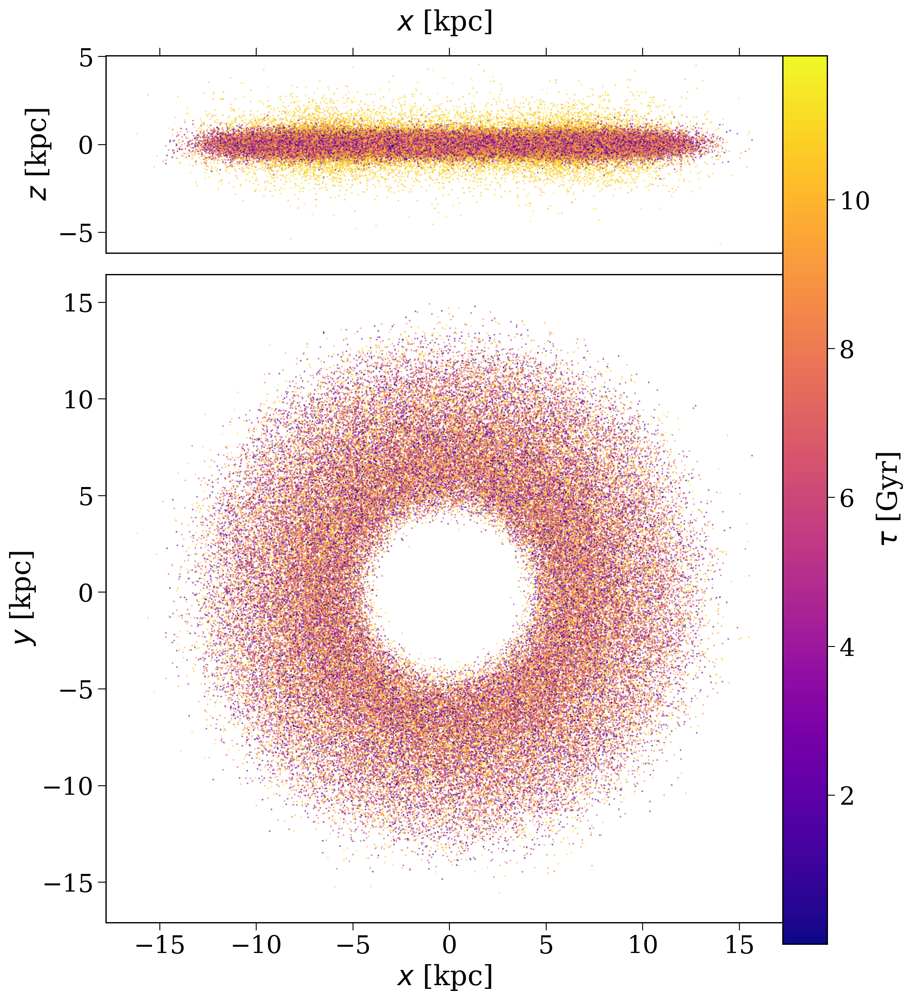

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [78]:
ring.plot(colour_by=ring.tau.value, cbar_norm=None, cbar_label=r'$\tau$ [Gyr]')

Alternatively, we can some of the builtin DFs in agama by passing a dictionary

In [84]:
class SimpleQID(cogsworth.sfh.DistributionFunctionBasedSFH):
    def draw_lookback_times(self, size=None, component=None):
        size = size if size is not None else self.size
        self._tau = np.random.uniform(0, 10, size) * u.Gyr
        return self._tau
    
    def get_metallicity(self):
        self._Z = np.repeat(0.02, self.size)
        return self._Z
    
qid = SimpleQID(100000, potential=gp.MilkyWayPotential2022(),
                df={
                    'type': 'QuasiIsothermal',
                    'Rdisk': 3.45,
                    'Rsigmar': 7.8,
                    'Rsigmaz': 7.8,
                    'sigmar0': (48.3*u.km/u.s).decompose(galactic).value,
                    'sigmaz0': (30.7*u.km/u.s).decompose(galactic).value,
                    'Sigma0': 1.0,
                })

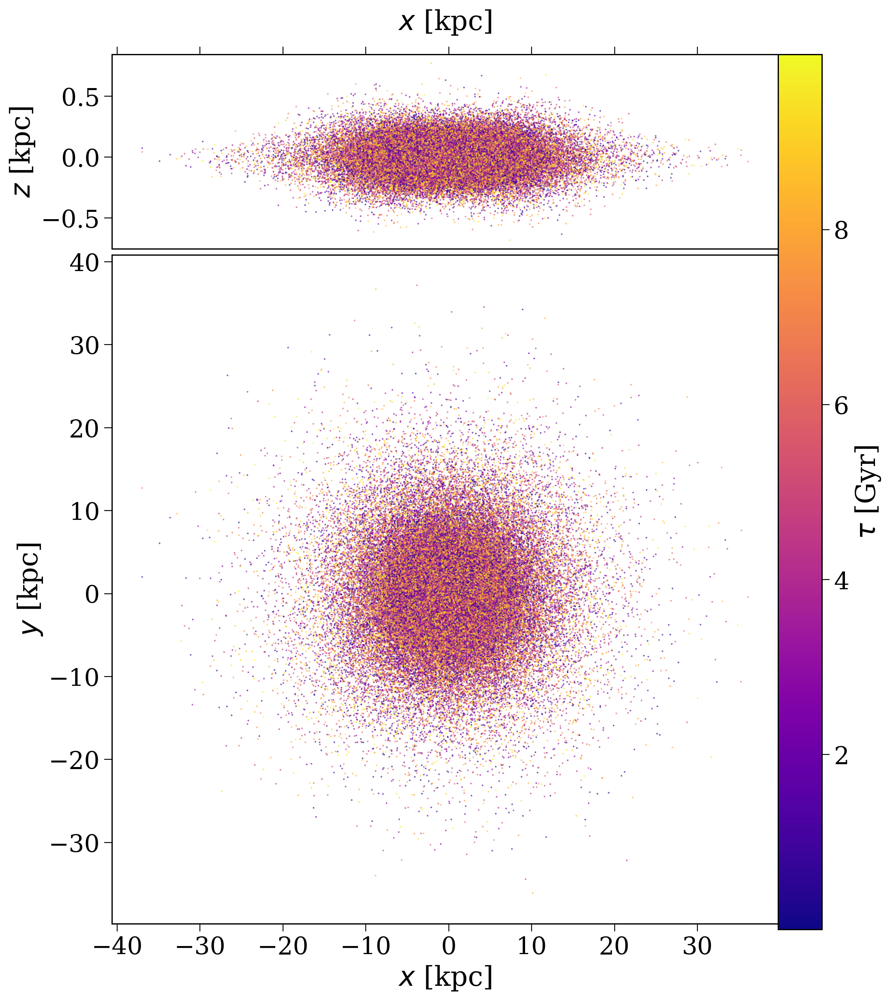

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [85]:
qid.plot(colour_by=qid.tau.value, cbar_norm=None, cbar_label=r'$\tau$ [Gyr]')

In [ ]:
p_sb15 = cogsworth.pop.Population(10000, sfh_model=cogsworth.sfh.SandersBinney2015,
                                  sfh_params={"potential": gp.MilkyWayPotential2022(),
                                              "time_bins": 5},
                                  use_default_BSE_settings=True)
p_sb15.create_population()

In [ ]:
p_wagg = cogsworth.pop.Population(10000, sfh_model=cogsworth.sfh.Wagg2022, use_default_BSE_settings=True)
p_wagg.create_population()

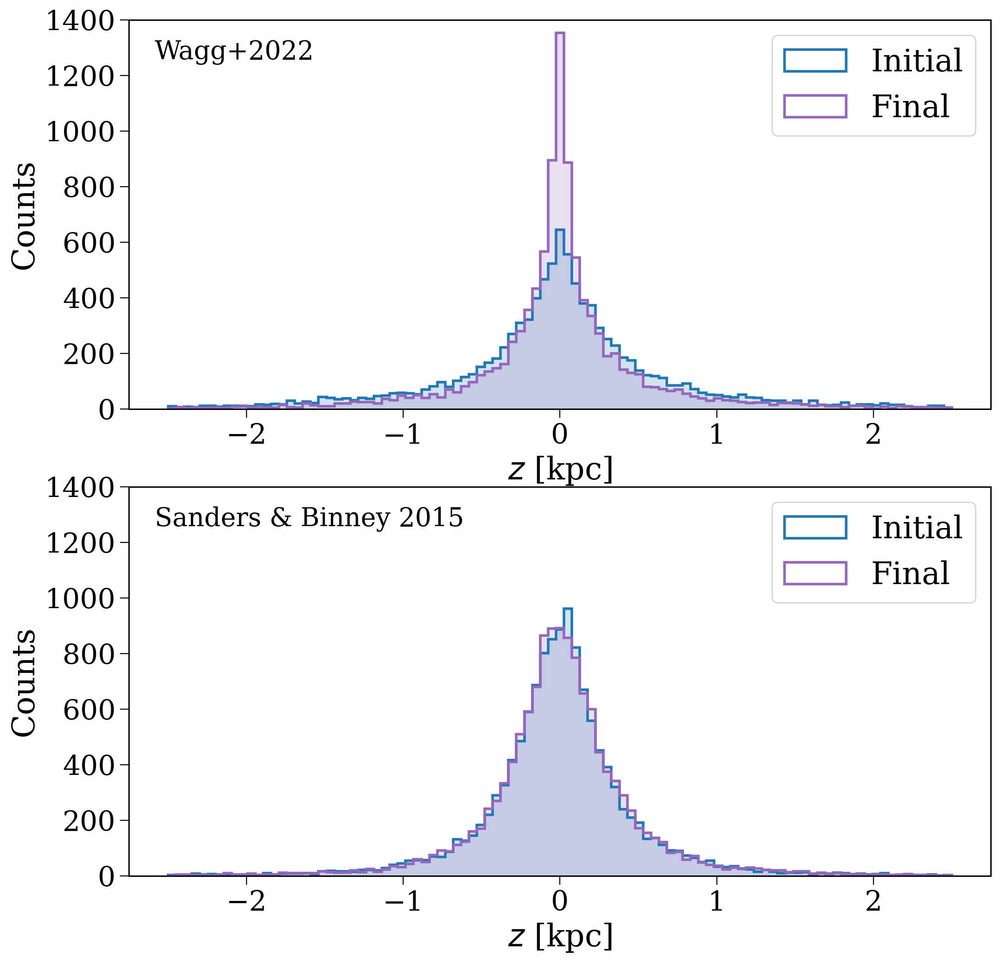

In [93]:
fig, axes = plt.subplots(2, 1, figsize=(12, 12))

# loop over both populations
for pop, pop_name, ax in zip([p_wagg, p_sb15], ["Wagg+2022", "Sanders & Binney 2015"], axes):

    # remove anything that got a kick
    were_kicked = pop.bpp[pop.bpp["evol_type"].isin([15, 16])]["bin_num"].unique()
    unkicked = ~np.isin(pop.bin_nums, were_kicked)

    # plot initial and final z distributions
    for z, c, l in zip([pop.initial_galaxy.z[unkicked].value,
                        pop.final_pos[:, 2][:len(pop)][unkicked].value],       # [:len(pop)] removes disrupted secondaries
                       ["tab:blue", "tab:purple"],
                       ["Initial", "Final"]):
        ax.hist(z, bins=np.linspace(-2.5, 2.5, 100), histtype="step", color=c, label=l, lw=2)
        ax.hist(z, bins=np.linspace(-2.5, 2.5, 100), color=c, alpha=0.2)

    ax.legend()
    ax.set_xlabel(r"$z$ [kpc]")
    ax.set_ylabel("Counts")
    ax.set_ylim(0, 1400)

    ax.annotate(pop_name, xy=(0.03, 0.95), xycoords='axes fraction', va='top', ha='left', fontsize=20)

plt.show()

Aha! So the non-distribution function based SFH (Wagg+2022) clearly shows that the stars become more concentrated towards the galactic centre over time. Whereas the Sanders & Binney (2015) model is in steady-state and the two distributions are pretty much indistinguishable.